<a href="https://colab.research.google.com/github/Mujeebunissa/ML_Projects/blob/main/Workshop_Linear_Classifier(perceptron).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Problem statement:
On a random dataset representing students CGPA,student's IQ,we need to classify if the student will get placement assisstance or not based on these features.
We analyse the data and implement linear classifier model


#Data Acquisition:
1.Importing libraries


In [ ]:
# Data manipulation
import numpy as np
import pandas as pd
from scipy.stats import randint

# Data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
# %matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

# Machine Learning
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
 # Classification Models
from sklearn.linear_model import Perceptron
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

 # Scaling and Encoding
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler, LabelEncoder,OrdinalEncoder

 # Model Evaluation
from sklearn.metrics import confusion_matrix, classification_report
 # Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV, cross_val_score, RandomizedSearchCV


2.Loading the dataset

In [ ]:
# Generating dataset
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

In [ ]:
X.shape

(100, 2)

In [ ]:
X[:,0]

array([ 0.19924745, -0.24882029, -0.3544904 , -1.59086506, -0.20083951,
       -0.83241122, -1.79207014,  0.0856607 , -0.55865299, -1.95974262,
       -1.77828947, -1.77985853, -0.02194151,  0.80563431, -1.82701214,
        0.38730728, -0.14108668, -1.87955941, -0.18232911, -1.77059533,
       -2.27658028, -2.06519502, -1.31690551,  1.61043259, -1.21650394,
        0.6139723 , -1.78760957, -1.04149161, -2.40067584, -1.80383452,
       -1.44075613,  1.34989978,  0.22520167,  0.53688527,  0.55483459,
       -0.32178185, -0.98821248,  0.67394805, -1.60913592,  0.75727194,
       -1.32591376, -0.91783293, -1.35578147,  1.46869659, -0.80540713,
        1.08059816,  0.14667326, -1.37324548, -1.09742089, -0.92017476,
        0.22020513, -0.3515292 , -1.42135667,  0.94415309,  2.14488191,
       -1.52699536,  1.0347932 , -2.05551135, -1.33241395, -0.10615042,
        0.89910594, -1.32152694, -1.96489671,  0.97099786,  0.0520771 ,
       -0.66393984, -1.8937672 ,  0.5941446 , -1.55261523, -0.99

#Data Visualization

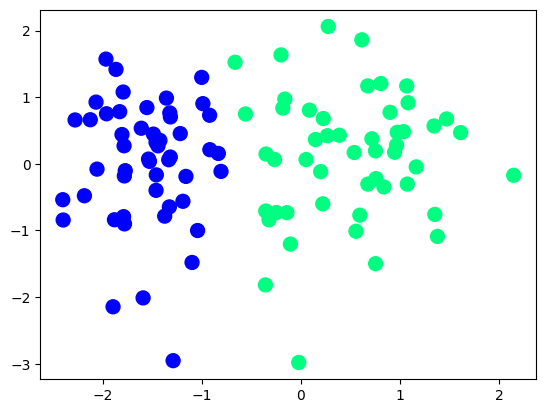

In [ ]:
# plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.show()

#Data Modelling

In [ ]:
def step(z):
    return 1 if z>0 else 0

In [ ]:
def perceptron(X,y):

    X = np.insert(X,0,1,axis=1)  # we add 1 to X
    weights = np.ones(X.shape[1])  #weights are of same dimensions as X, initialised  to 1
    lr = 0.1  #learning rate
    epoch=1000

    for i in range(1000):   #loop runs epoch times
        j = np.random.randint(0,100)  # selection of random point
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

    return weights[0],weights[1:]


In [ ]:
intercept_,coef_ = perceptron(X,y)

In [ ]:
print(coef_)
print(intercept_)

[1.31038156 0.13323298]
1.0


In [ ]:
# Slope and intercept of line(decision boundary)
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [ ]:
x_input = np.linspace(-3,3,100)  # creating 100 values between -3 and 3
y_input = m*x_input + b

(-3.0, 2.0)

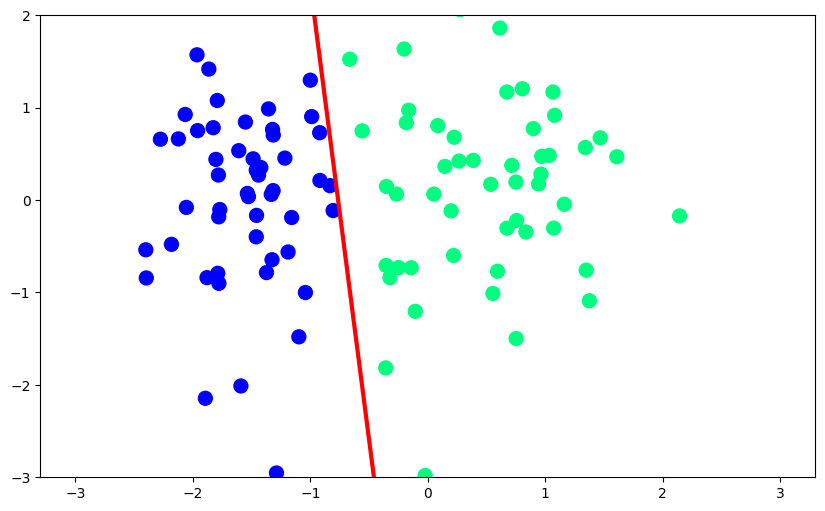

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [ ]:
def perceptron(X,y):

    m = []
    b = []

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))

    return m,b

In [ ]:
m,b=perceptron(X,y)

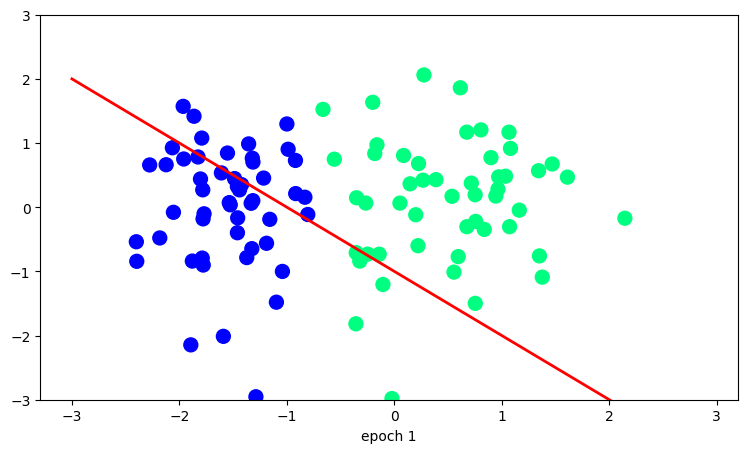

In [ ]:
from IPython.display import HTML
fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i*m[0] +b[0]
ax.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
line, = ax.plot(x_i, x_i*m[0] +b[0] , 'r-', linewidth=2)
plt.ylim(-3,3)
def update(i):
    label = 'epoch {0}'.format(i + 1)
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(label)
    # return line, ax

anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)
HTML(anim.to_jshtml())

In [ ]:
log_reg = LogisticRegression()
log_reg.fit(X,y)

LogisticRegression()

In [ ]:
m = -(log_reg.coef_[0][0]/log_reg.coef_[0][1])
b = -(log_reg.intercept_/log_reg.coef_[0][1])

In [ ]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

(-3.0, 2.0)

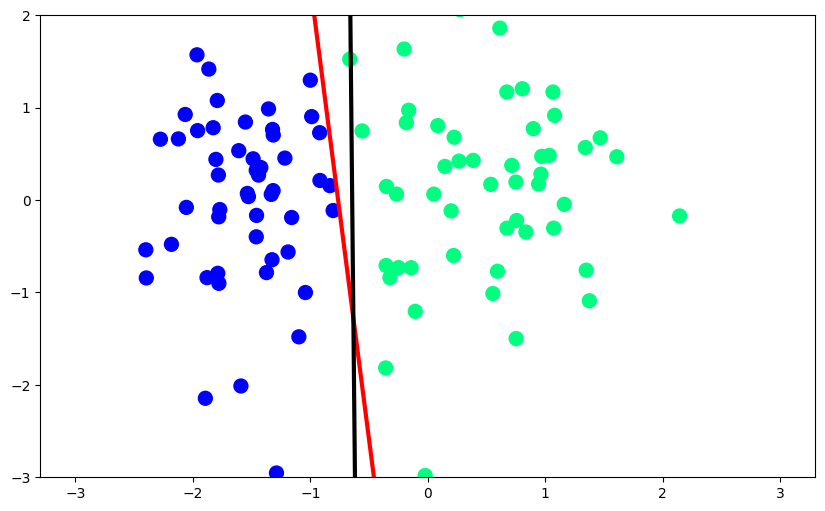

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)
